In [1]:
import src

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import shapefile as shp
import seaborn as sns

import sklearn as sk
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler

In [2]:
PATH_ROOT =  './' #change dir to your project folder
DATA_ROOT = PATH_ROOT+'data/'

# Process data for the regression

In [3]:
data = pd.read_csv(DATA_ROOT + "data_processed.csv")
data.head(1)

,Unnamed: 0,Reporting District,Crime Code Description,Victim Age,Victim Sex,Victim Descent,Premise Description,Weapon Description,Year,Month,Day,Week Day,Hour,Shift Hours,Victim Tranche Age,Latitude,Longitude,Cell Nb
0,0,1241,INTIMATE PARTNER - ASSAULT,30.0,F,White,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)","STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",2013,3,11,Mon,18,18-22[,20.0,33.9829,-118.3338,1519


In [4]:
time_labels=['Year', 'Month', 'Day', 'Week Day', 'Shift Hours']

# performs one shot encoding of Cell Number
dummies=pd.get_dummies(data['Cell Nb'])
# one shot encoded data
df_regression=pd.concat([data[time_labels], dummies], axis=1)

In [17]:
# agglomerates crimes which happened during the same patrol shift and dat, and start on a Monday
df_regression=df_regression.groupby(['Year', 'Month', 'Day', 'Week Day', 'Shift Hours']).sum().reset_index()[18:-1]
df_regression

,Year,Month,Day,Week Day,Shift Hours,34,35,36,80,81,...,Sun,Thu,Tue,Wed,10-14[,14-18[,18-22[,2-6[,22-2[,6-10[
18,2010,1,7,Thu,10-14[,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
19,2010,1,7,Thu,14-18[,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
20,2010,1,7,Thu,18-22[,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
21,2010,1,7,Thu,2-6[,0,1,0,0,0,...,0,1,0,0,0,0,0,1,0,0
22,2010,1,7,Thu,22-2[,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16828,2017,9,8,Fri,22-2[,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
16829,2017,9,8,Fri,6-10[,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
16830,2017,9,9,Sat,10-14[,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
16831,2017,9,9,Sat,14-18[,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [6]:
# creates the typical week which has 7 days and 6 shifts, in one shot encoding

# performs one shot encoding of Week Day and Shift Hours
dummies1=pd.get_dummies(df_regression['Week Day'])
dummies2=pd.get_dummies(df_regression['Shift Hours'])

df_regression=pd.concat([df_regression, dummies1, dummies2], axis=1)

# orders labels in a logic way
X_labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun', '2-6[', '6-10[','10-14[', '14-18[', '18-22[',  '22-2[']
X=df_regression[X_labels]
X.head()

,Mon,Tue,Wed,Thu,Fri,Sat,Sun,2-6[,6-10[,10-14[,14-18[,18-22[,22-2[
18,1,0,0,0,0,0,0,0,0,1,0,0,0
19,1,0,0,0,0,0,0,0,0,0,1,0,0
20,1,0,0,0,0,0,0,0,0,0,0,1,0
21,1,0,0,0,0,0,0,1,0,0,0,0,0
22,1,0,0,0,0,0,0,0,0,0,0,0,1


In [7]:
# creates heatmaps data to be fitted with X
y=df_regression.drop(columns=time_labels + X_labels)
y.head()

,34,35,36,80,81,82,83,84,85,86,...,3330,3331,3332,3333,3334,3335,3336,3337,3375,3376
18,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
22,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Perform the regression

In [8]:
# performs regression with one hot encoded data
# input: time data X
# output: heatmaps y
model = RandomForestRegressor()
model.fit(X,y)

/Applications/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [9]:
# get the 42 "typical heatmaps" -  time resolution: 6 shifts * 7 days = 42
y_pred = model.predict(X[0:42])
print('Min and Max values of the 42 typical heatmaps :', np.min(y_pred), 'and', np.max(y_pred))
pos_max=np.argmax(y_pred)//len(y_pred[0])
print('The maximum value is located in the', pos_max, 'th cell number which corresponds to a typical Synday between 18h and 22h')

Min and Max values of the 42 typical heatmaps : 0.0 and 1.6510998596555861
The maximum value is located in the 34 th cell number which corresponds to a typical Synday between 18h and 22h


,count,mean,std,min,25%,50%,75%,max
0,1428.0,0.067876,0.112592,0.0,0.004737,0.032235,0.088179,1.6511


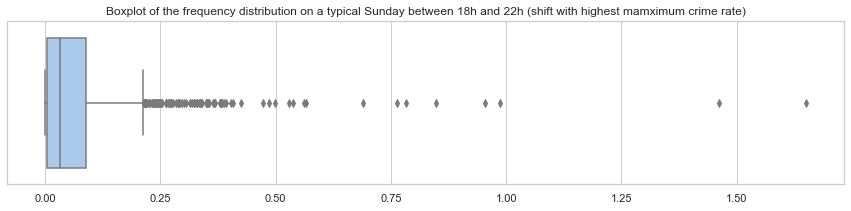

In [10]:
display(pd.DataFrame(y_pred[pos_max]).describe().T)
sns.set(style="whitegrid", palette="pastel", color_codes=True, rc={'figure.figsize':(15,3)})
ax = sns.boxplot(y_pred[pos_max]).set_title('Boxplot of the frequency distribution on a typical Sunday between 18h and 22h (shift with highest mamximum crime rate)')


### Conclusion of the regression
The result of the regression gives a frequency distribution of the number of crime per cell grid of 1km^2 in Los Angeles. 1.2 million crime records are encoded per cell (there are 1428 cells where at least one crime has happened in 8 years). One can observe that the typical crime frequency per shift is very low. The boxplot above represents the shift with highest maximum crime rate, hence it is certainly much lower for many other shift.

We will now normalise all values and extracts the 42 typical heatmaps

In [11]:
# ONE SCALE FOR THE ENTIRE DATA
df_typical_heat_map = (pd.DataFrame(y_pred.T)-np.min(y_pred))/(np.max(y_pred))-np.min(y_pred)

# add cell number as index
df_typical_heat_map['Cell Nb'] = y.columns
df_typical_heat_map=df_typical_heat_map.set_index('Cell Nb')

# renames columns with day + shift and extract one week (42 first items)
df_typical_heat_map.columns=(df_regression['Week Day']+ ' ' + df_regression['Shift Hours'])[0:42]
df_typical_heat_map.head()

,Mon 10-14[,Mon 14-18[,Mon 18-22[,Mon 2-6[,Mon 22-2[,Mon 6-10[,Tue 10-14[,Tue 14-18[,Tue 18-22[,Tue 2-6[,...,Sat 18-22[,Sat 2-6[,Sat 22-2[,Sat 6-10[,Sun 10-14[,Sun 14-18[,Sun 18-22[,Sun 2-6[,Sun 22-2[,Sun 6-10[
Cell Nb,,,,,,,,,,,,,,,,,,,,,
34,0.000000,0.000611,0.000000,0.001197,0.002368,0.000000,0.002738,0.002182,0.003282,0.001195,...,0.002738,0.003526,0.008402,0.001198,0.002774,0.002002,0.001184,0.001089,0.003615,0.001085
35,0.024893,0.016871,0.007899,0.001526,0.011233,0.011907,0.010324,0.019617,0.028160,0.006026,...,0.018034,0.019533,0.022733,0.002222,0.010080,0.041934,0.031012,0.009201,0.018997,0.007400
36,0.009963,0.012000,0.029602,0.002286,0.008718,0.013263,0.019970,0.038665,0.018030,0.014688,...,0.039238,0.008229,0.024931,0.002965,0.024600,0.015761,0.038004,0.019430,0.033801,0.011923
80,0.007628,0.000000,0.000853,0.000000,0.004090,0.001821,0.001300,0.001348,0.000000,0.000000,...,0.003402,0.006329,0.002721,0.000000,0.001041,0.001517,0.003847,0.001498,0.004812,0.000000
81,0.004470,0.003391,0.006965,0.002718,0.004170,0.004453,0.004756,0.003719,0.011113,0.006760,...,0.005050,0.000000,0.006144,0.000000,0.007787,0.017756,0.001973,0.000789,0.003460,0.004195


In [18]:
df_typical_heat_map

,Mon 10-14[,Mon 14-18[,Mon 18-22[,Mon 2-6[,Mon 22-2[,Mon 6-10[,Tue 10-14[,Tue 14-18[,Tue 18-22[,Tue 2-6[,...,Sat 18-22[,Sat 2-6[,Sat 22-2[,Sat 6-10[,Sun 10-14[,Sun 14-18[,Sun 18-22[,Sun 2-6[,Sun 22-2[,Sun 6-10[
Cell Nb,,,,,,,,,,,,,,,,,,,,,
34,0.000000,0.000611,0.000000,0.001197,0.002368,0.000000,0.002738,0.002182,0.003282,0.001195,...,0.002738,0.003526,0.008402,0.001198,0.002774,0.002002,0.001184,0.001089,0.003615,0.001085
35,0.024893,0.016871,0.007899,0.001526,0.011233,0.011907,0.010324,0.019617,0.028160,0.006026,...,0.018034,0.019533,0.022733,0.002222,0.010080,0.041934,0.031012,0.009201,0.018997,0.007400
36,0.009963,0.012000,0.029602,0.002286,0.008718,0.013263,0.019970,0.038665,0.018030,0.014688,...,0.039238,0.008229,0.024931,0.002965,0.024600,0.015761,0.038004,0.019430,0.033801,0.011923
80,0.007628,0.000000,0.000853,0.000000,0.004090,0.001821,0.001300,0.001348,0.000000,0.000000,...,0.003402,0.006329,0.002721,0.000000,0.001041,0.001517,0.003847,0.001498,0.004812,0.000000
81,0.004470,0.003391,0.006965,0.002718,0.004170,0.004453,0.004756,0.003719,0.011113,0.006760,...,0.005050,0.000000,0.006144,0.000000,0.007787,0.017756,0.001973,0.000789,0.003460,0.004195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3335,0.010817,0.016416,0.009493,0.005414,0.015225,0.013173,0.006162,0.005030,0.012855,0.001354,...,0.010588,0.002255,0.010527,0.010539,0.002520,0.004148,0.016271,0.005324,0.006937,0.001391
3336,0.003486,0.001223,0.001474,0.001791,0.001755,0.005699,0.004388,0.006459,0.012202,0.003225,...,0.003663,0.008190,0.002139,0.001338,0.002834,0.002445,0.000000,0.001358,0.002920,0.000000
3337,0.000000,0.000000,0.001628,0.000897,0.002505,0.000000,0.002123,0.001829,0.000000,0.000000,...,0.000000,0.000000,0.003746,0.000000,0.000000,0.000000,0.000000,0.000000,0.003210,0.000000


In [12]:
df_typical_heat_map.to_csv('data/typical_heatmaps.csv', index=True)

# Map the crime normalised frequency distribution in a typical week, during each day and shift of a LAPD patrol

In [13]:
shp_path = DATA_ROOT+"LAPD_Reporting_Districts.shp"
sf = shp.Reader(shp_path)

df_shp = src.shp_to_df(sf)

# constants for the mapping
min_long_LAPD = -118.6682
max_long_LAPD = -118.15537
min_lat_LAPD = 33.703656
max_lat_LAPD = 34.33731
data_q = data[data['Latitude'] >= min_lat_LAPD]
data_q = data[data['Latitude'] <= max_lat_LAPD]
data_q = data[data['Longitude'] >= min_long_LAPD]
data_q = data[data['Longitude'] <= max_long_LAPD]
km_long = round(0.1/9.208,5)
km_lat = round(0.1/11.119,5)
nb_vertical = int(np.ceil((max_lat_LAPD-min_lat_LAPD)/km_lat))
nb_horizontal = int(np.ceil((max_long_LAPD-min_long_LAPD)/km_long))

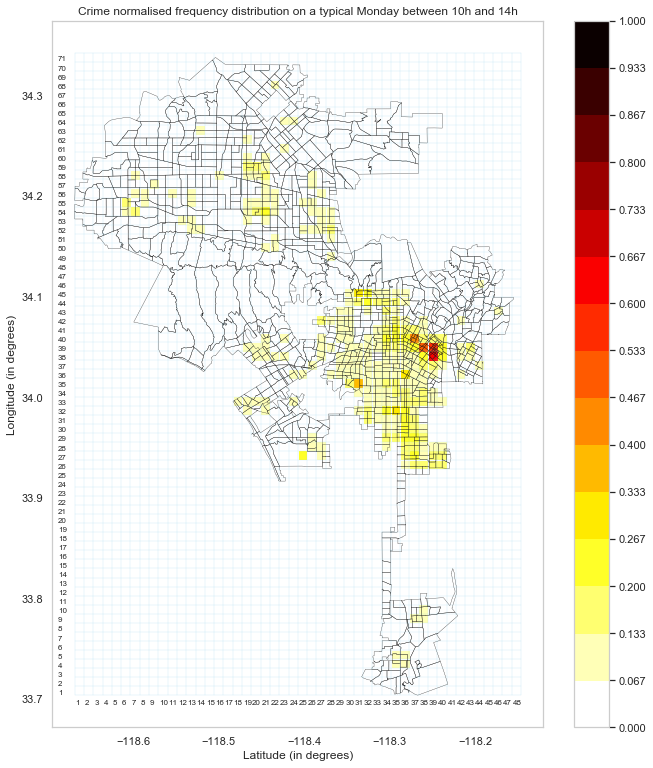

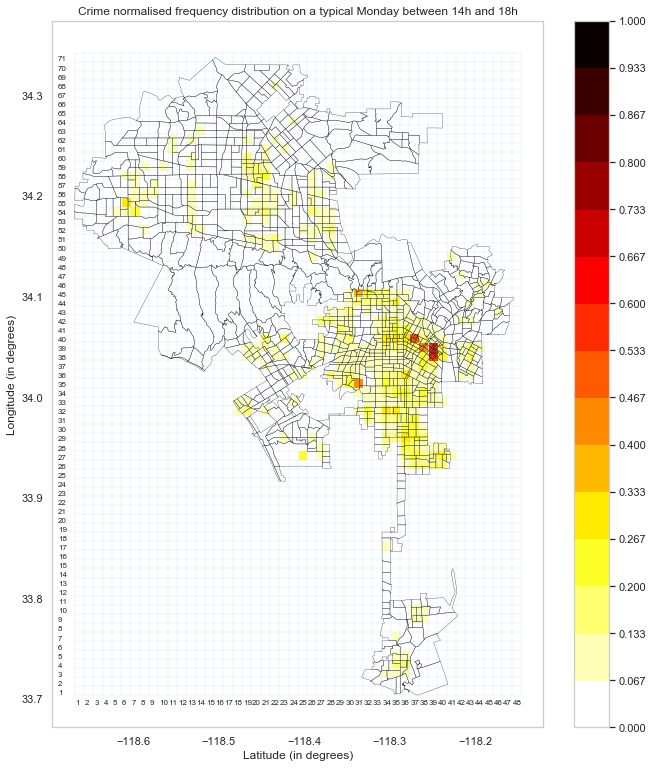

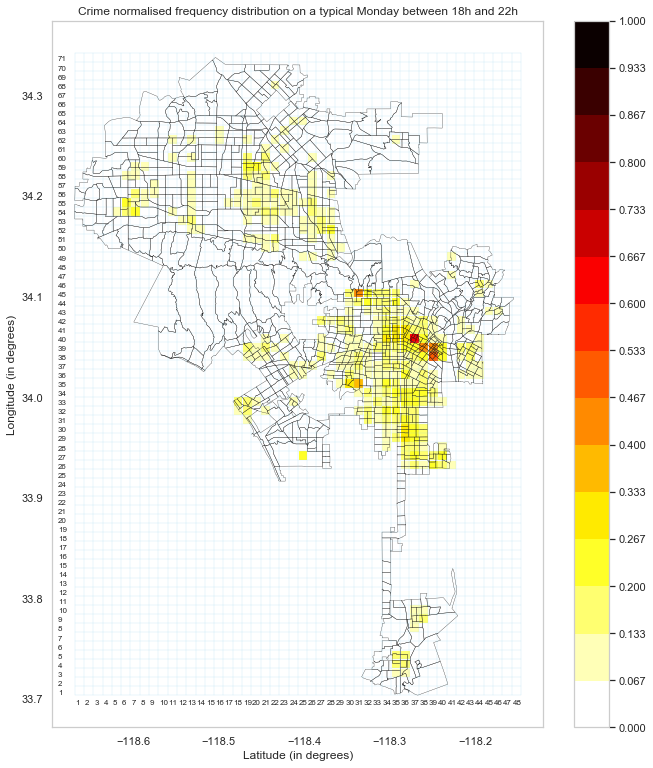

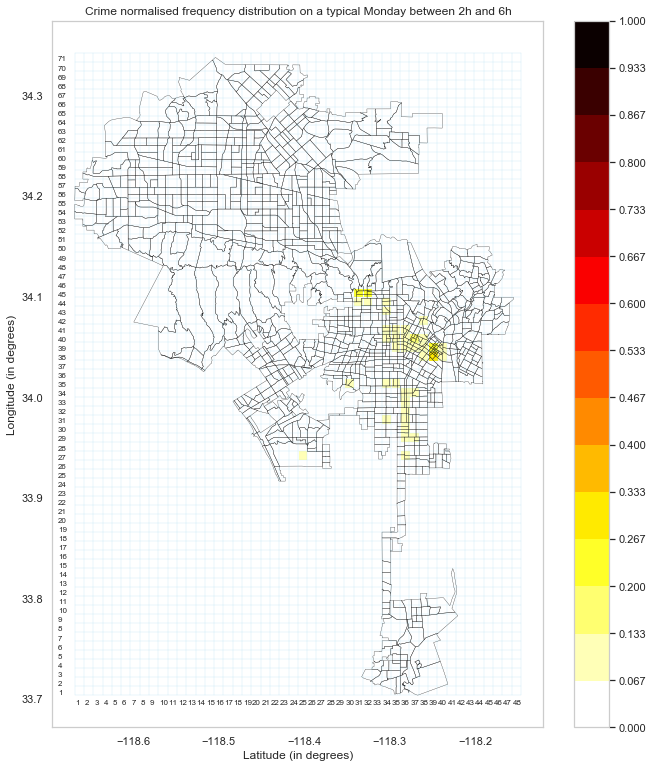

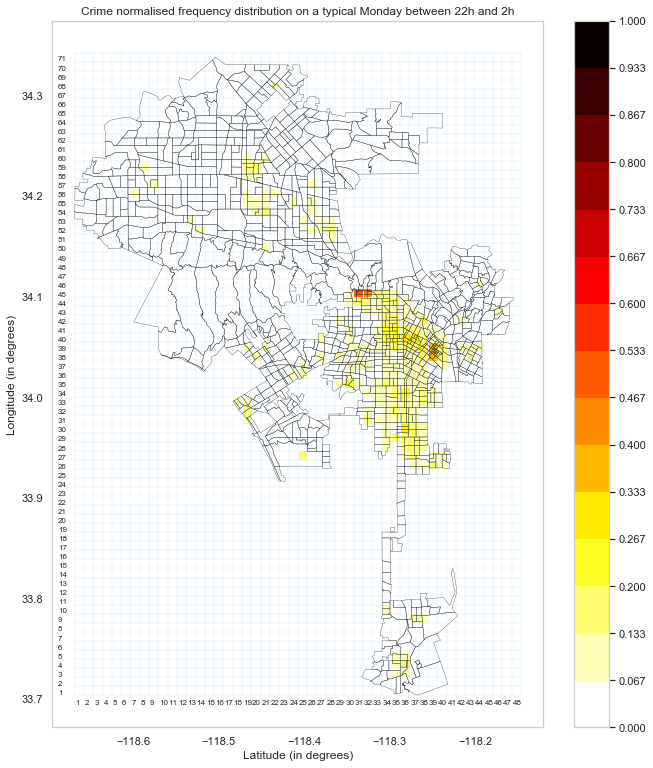

...

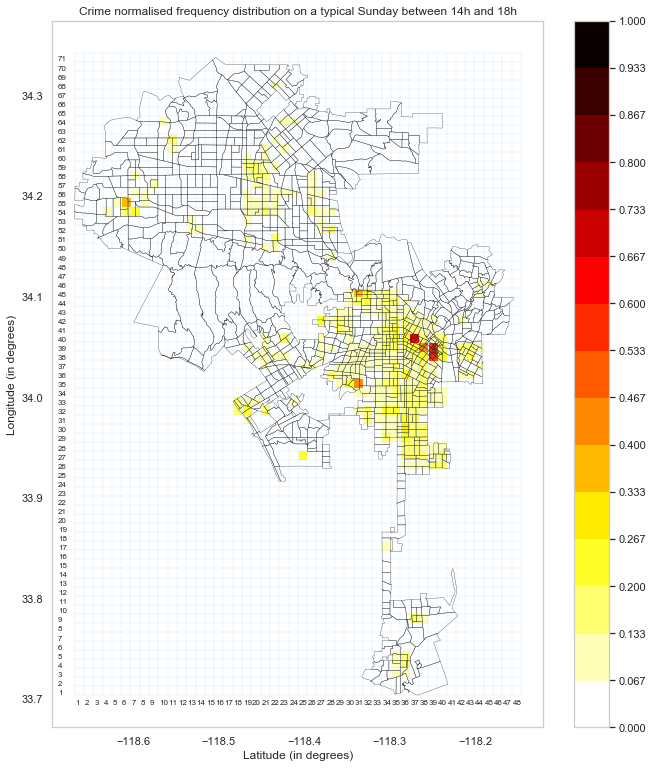

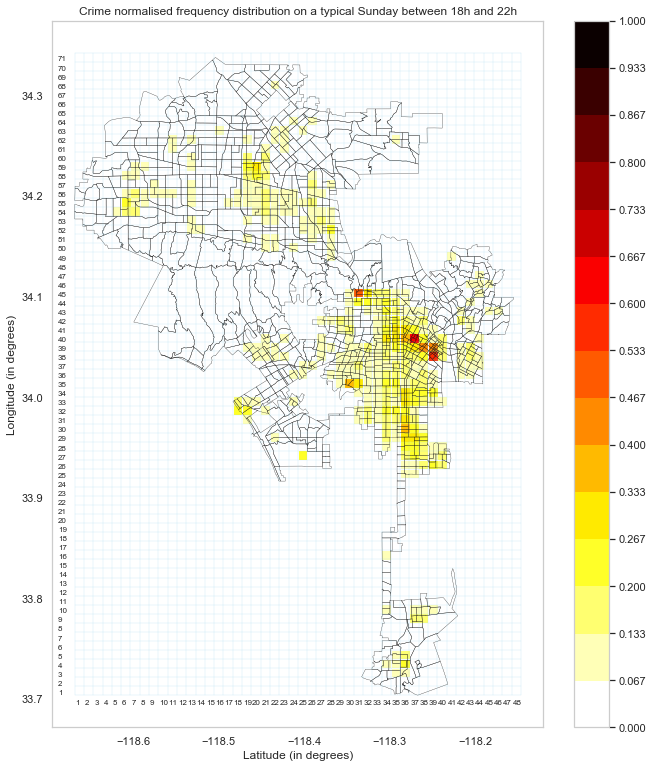

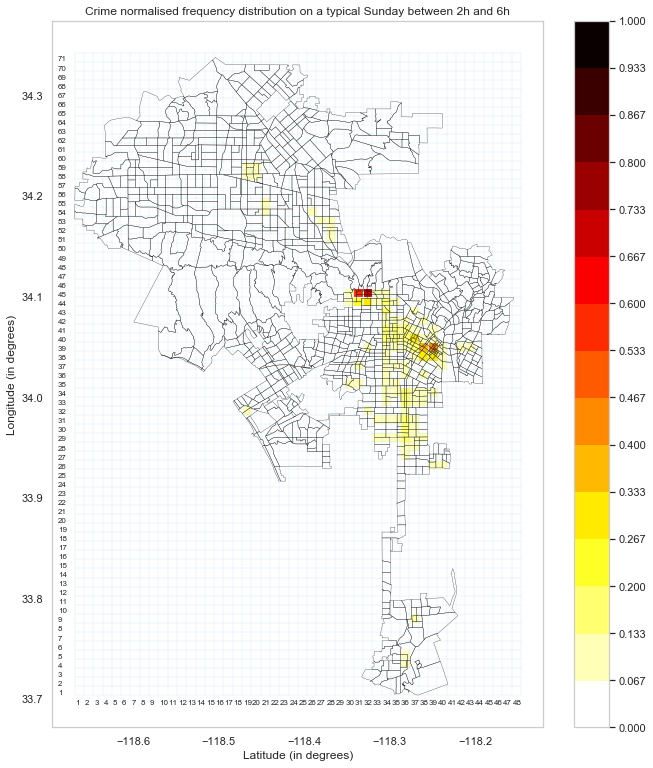

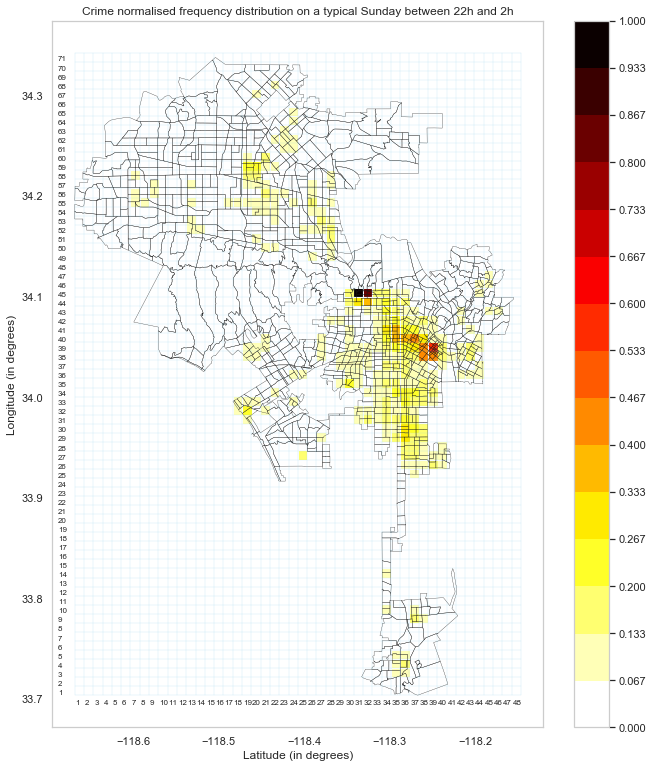

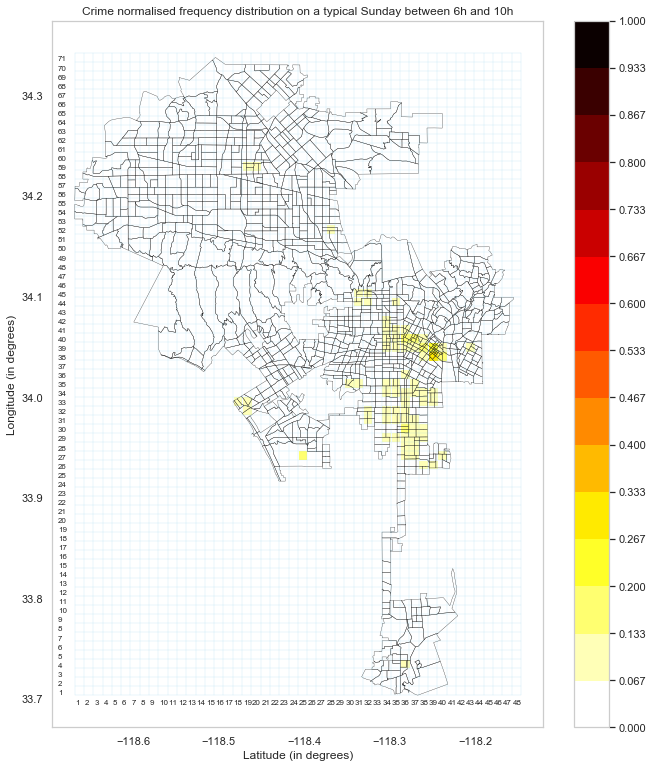

In [16]:
# plot & save ALL maps
for shift in list(df_typical_heat_map.columns):
    src.plot_map_LA(sf, nb_vertical, nb_horizontal,
                    crimes=False, heatmap = True, save_map=False,
                    data_count = df_typical_heat_map[shift], 
                    map_title = src.get_title(shift))

In [ ]:
# plot & save one maps
#src.plot_map_LA(sf, nb_vertical, nb_horizontal,
#            crimes=False, heatmap = True, save_map=False,
#            data_count=df_typical_heat_map['Mon 22-2['], map_title=src.get_title('Mon 22-2['))